<a href="https://colab.research.google.com/github/nerbivol/siamese_damage_detection/blob/main/model_result.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 599.6/599.6 kB 35.1 MB/s eta 0:00:00


In [ ]:
import os
import matplotlib.pyplot as plt
import random
import glob

import cv2
import numpy as np
from ultralytics import YOLO

import torch
import tensorflow as tf

In [ ]:
# checking availability of GPU resources
print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.0.1+cu118 (Tesla T4)


In [ ]:
from pathlib import Path

base_path = "/content/drive/MyDrive/Colab Notebooks"

os.chdir(f'{base_path}')

folder_name = "DamageBuilding"
Path(f'{base_path}/{folder_name}').mkdir(parents=True, exist_ok=True)
os.chdir(f'{base_path}/{folder_name}')

!pwd

!ls

/content/drive/MyDrive/Colab Notebooks/DamageBuilding
annotations.csv      model_result.ipynb  Siamese_classify.ipynb  yolov8s.pt
clasify		     PostImages		 train
Damage_YOLOv8.ipynb  preprocess.ipynb	 valid
data.yaml	     runs		 yolov8n.pt


In [ ]:
detect_model = YOLO("runs/detect/train6/weights/best.pt")
classify_name = "20230608-062743/model_20230608-062743_014_0.7642.h5"
MODEL_PATH = f"clasify/model-checkpts/{classify_name}"
classify_model = tf.keras.models.load_model(MODEL_PATH)

In [ ]:
def class_predict(pre_image , post_image):
  pre_image = tf.image.resize(pre_image, (64, 64))[None, :]
  pre_image = tf.image.per_image_standardization(pre_image)

  post_image = tf.image.resize(post_image, (64, 64))[None, :]
  post_image = tf.image.per_image_standardization(post_image)

  pred = classify_model.predict([pre_image, post_image])
  return np.argmax(pred)

In [ ]:
# Color codes for bounding boxs
damage_dict = {
    0: (0, 255, 0),
    1:(255, 255, 102),
    2: (255, 153, 51),
    3: (255, 0, 0)
}

In [ ]:
def plot_images_with_boxes(image_file, result):
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharey=True, figsize=(30, 15))

    post_image = image_file.replace('pre', 'post')
    annotation_path = post_image.replace('images', 'labels').replace('jpg', 'txt')
    print(annotation_path)

    image = cv2.imread(post_image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    pre_image = cv2.imread(image_file)
    pre_image = cv2.cvtColor(pre_image, cv2.COLOR_BGR2RGB)

    with open(annotation_path, "r") as f:
        annotations = f.readlines()

    ax1.imshow(pre_image)
    ax1.set_title('Pre image', fontsize=24)

    ax2.imshow(image)
    ax2.set_title('Post image', fontsize=24)

    image_predict = image.copy()

    for annotation in annotations:
        class_id, x, y, width, height = map(float, annotation.split())
        left = int((x - width / 2) * image.shape[1])
        top = int((y - height / 2) * image.shape[0])
        right = int((x + width / 2) * image.shape[1])
        bottom = int((y + height / 2) * image.shape[0])

        cv2.rectangle(image, (left, top), (right, bottom), damage_dict[int(class_id)], 2)

    ax3.imshow(image)
    ax3.set_title('True label', fontsize=24)

    for box in result[0].boxes:
      left, bottom, right, top = map(int, box.xyxy[0])
      # print(f"{right-left}, {top-bottom} px")
      class_id = class_predict(pre_image[left:right, bottom:top], image[left:right, bottom:top])

      cv2.rectangle(image_predict, (left, bottom), (right, top), damage_dict[int(class_id)], 2)

    ax4.imshow(image_predict)
    ax4.set_title('Predict label', fontsize=24)

    ax1.axis('off')
    ax2.axis('off')
    ax3.axis('off')
    ax4.axis('off')
    plt.show()

In [ ]:
image_path = 'PostImages/images'
label_path = 'PostImages/labels'

pre_images = sorted(glob.glob(os.path.join(image_path, "*pre*")))
post_images = sorted(glob.glob(os.path.join(image_path, "*post*")))

# pre_label = sorted(glob.glob(os.path.join(label_path, "*pre*")))
# post_label = sorted(glob.glob(os.path.join(label_path, "*post*")))



image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/mexico-earthquake_00000129_pre_0_1.jpg: 512x512 54 roofs, 11.3ms
Speed: 1.4ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/mexico-earthquake_00000129_post_0_1.txt
1/1 [==============================] - 0s 23ms/step


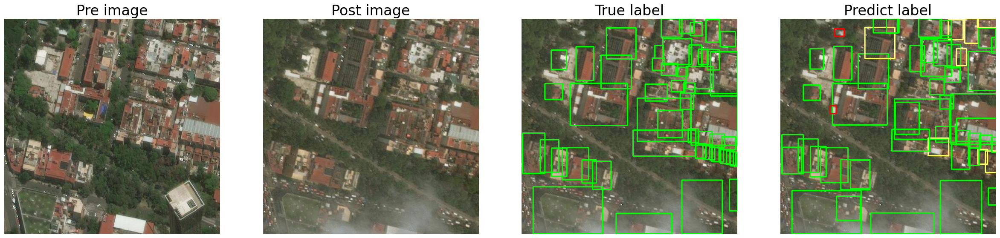


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/hurricane-michael_00000226_pre_1_1.jpg: 512x512 6 roofs, 11.2ms
Speed: 1.3ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/hurricane-michael_00000226_post_1_1.txt
1/1 [==============================] - 0s 29ms/step


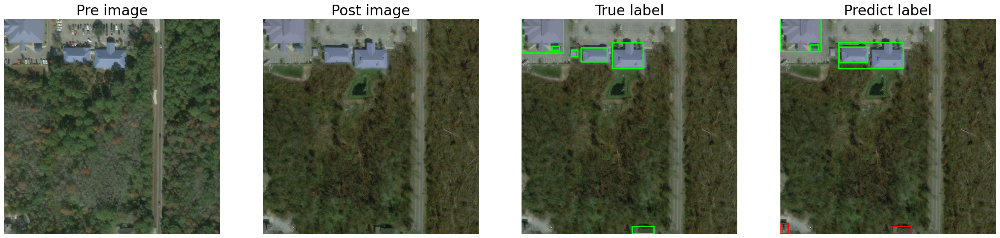


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/santa-rosa-wildfire_00000005_pre_0_0.jpg: 512x512 10 roofs, 11.2ms
Speed: 1.3ms preprocess, 11.2ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/santa-rosa-wildfire_00000005_post_0_0.txt
1/1 [==============================] - 0s 80ms/step


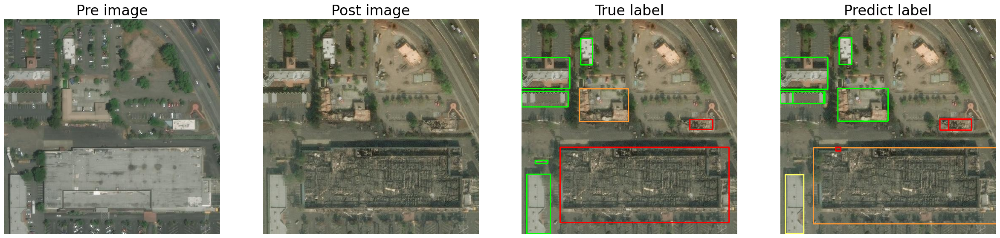


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/socal-fire_00000325_pre_1_1.jpg: 512x512 13 roofs, 11.2ms
Speed: 1.2ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/socal-fire_00000325_post_1_1.txt
1/1 [==============================] - 0s 29ms/step


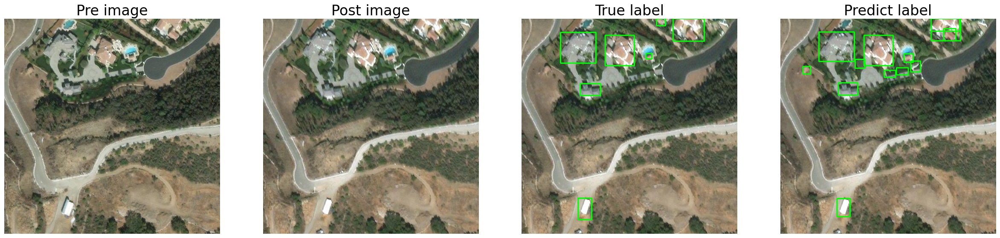


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/palu-tsunami_00000083_pre_0_1.jpg: 512x512 5 roofs, 11.2ms
Speed: 1.3ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/palu-tsunami_00000083_post_0_1.txt
1/1 [==============================] - 0s 34ms/step


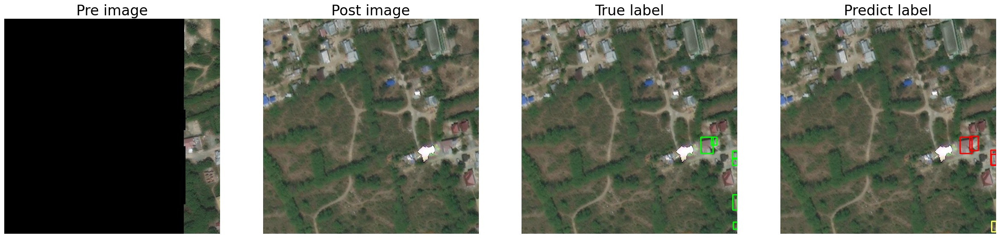


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/hurricane-michael_00000313_pre_0_1.jpg: 512x512 27 roofs, 11.3ms
Speed: 1.3ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/hurricane-michael_00000313_post_0_1.txt
1/1 [==============================] - 0s 38ms/step


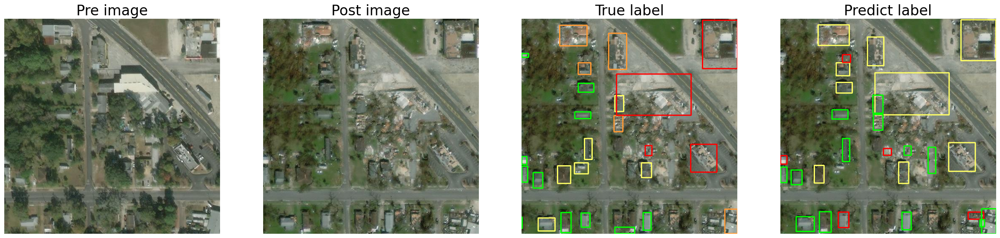


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/hurricane-michael_00000090_pre_1_0.jpg: 512x512 40 roofs, 11.3ms
Speed: 1.6ms preprocess, 11.3ms inference, 2.6ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/hurricane-michael_00000090_post_1_0.txt
1/1 [==============================] - 0s 45ms/step


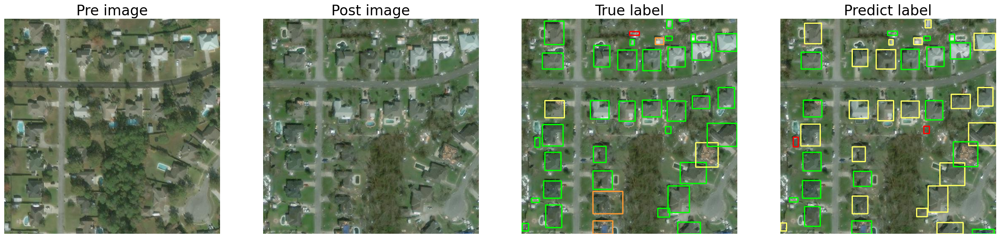


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/hurricane-michael_00000085_pre_1_1.jpg: 512x512 23 roofs, 11.3ms
Speed: 1.6ms preprocess, 11.3ms inference, 2.6ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/hurricane-michael_00000085_post_1_1.txt
1/1 [==============================] - 0s 57ms/step


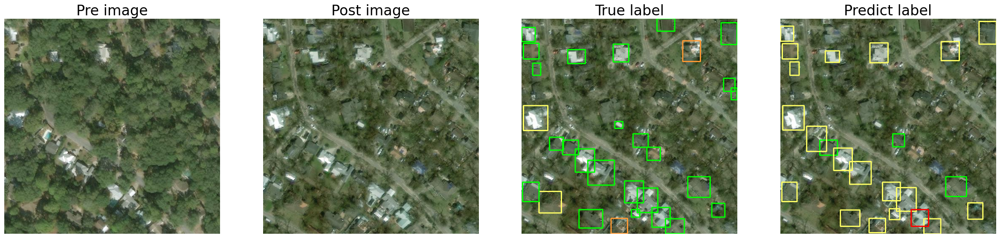


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/palu-tsunami_00000064_pre_0_1.jpg: 512x512 36 roofs, 11.7ms
Speed: 1.5ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/palu-tsunami_00000064_post_0_1.txt
1/1 [==============================] - 0s 33ms/step


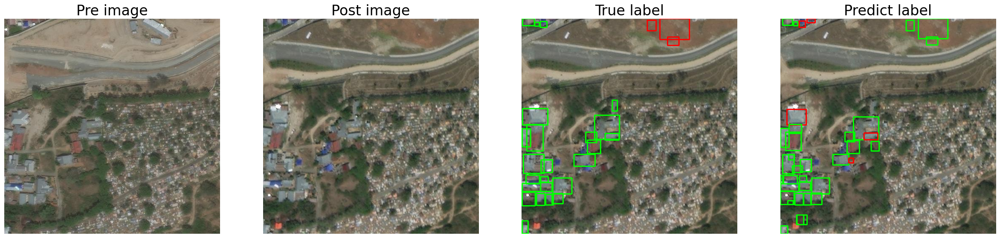


image 1/1 /content/drive/MyDrive/Colab Notebooks/DamageBuilding/PostImages/images/hurricane-michael_00000103_pre_1_0.jpg: 512x512 1 roof, 11.3ms
Speed: 1.5ms preprocess, 11.3ms inference, 1.8ms postprocess per image at shape (1, 3, 512, 512)
Results saved to runs/detect/predict3


PostImages/labels/hurricane-michael_00000103_post_1_0.txt
1/1 [==============================] - 0s 31ms/step


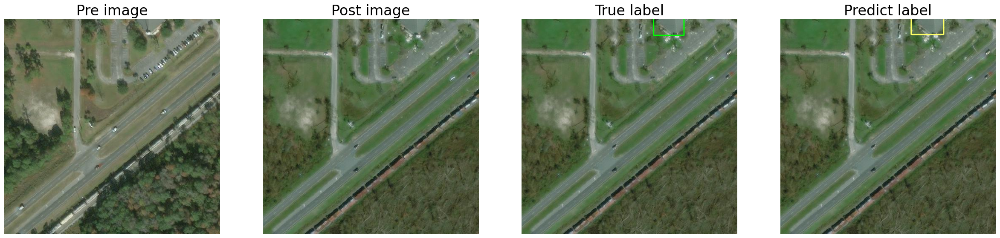

In [ ]:
num_images = 10

random.shuffle(pre_images)
image_files = pre_images[:num_images]

for image_file in image_files:
  result = detect_model.predict(source=image_file, show_labels=False, save=True, retina_masks=True)
  plot_images_with_boxes(image_file, result)